<a href="https://colab.research.google.com/github/AshokPatnaik7/HackwithHyderabad/blob/main/Hackathonhyderabad2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os

# Define the source directory in Google Drive
drive_data_path = '/content/drive/MyDrive/Hackathonhyd'

# Define the destination directory in the Colab environment
colab_data_path = '/content/'

# List of zip files to copy
zip_files_to_copy = ['train1.zip', 'test1.zip', 'scripts.zip'] # Corrected zip file name

# Copy each zip file
for zip_file in zip_files_to_copy:
    source_path = os.path.join(drive_data_path, zip_file)
    destination_path = os.path.join(colab_data_path, zip_file)

    if os.path.exists(source_path):
        print(f"Copying {zip_file} from Drive...")
        !cp "{source_path}" "{destination_path}"
        print(f"Copied {zip_file}.")
    else:
        print(f"Error: {zip_file} not found in {drive_data_path}")

# Verify the files are copied
print("\nFiles in /content/ after copying:")
!ls -lh /content/

Copying train1.zip from Drive...
Copied train1.zip.
Copying test1.zip from Drive...
Copied test1.zip.
Copying scripts.zip from Drive...
Copied scripts.zip.

Files in /content/ after copying:
total 9.9G
drwx------ 6 root root 4.0K Sep 21 09:07 drive
drwxr-xr-x 3 root root 4.0K Sep 21 09:07 runs
drwxr-xr-x 1 root root 4.0K Sep 16 13:40 sample_data
-rw------- 1 root root 6.5K Sep 21 09:10 scripts.zip
-rw------- 1 root root 4.0G Sep 21 09:10 test1.zip
-rw------- 1 root root 6.0G Sep 21 09:09 train1.zip
-rw-r--r-- 1 root root 6.3M Sep 21 09:07 yolov8n.pt


In [6]:
# unzip all zip files into folders with the same base name
import zipfile, glob, os

# Explicitly list the zip files to process
zips_to_process = ["train1.zip", "test1.zip", "scripts.zip"] # Corrected zip file name

print("Processing zips:", zips_to_process)

for z in zips_to_process:
    if os.path.exists(z) and zipfile.is_zipfile(z):
        outdir = z.replace('.zip','')
        print(f"-> Unzipping {z} to {outdir}")
        with zipfile.ZipFile(z, 'r') as zip_ref:
            zip_ref.extractall(outdir)
    else:
        print(f"-> Skipping {z} as it is not a valid zip file or does not exist.")


# quick tree of top-level extracted dirs
for d in sorted(os.listdir()):
    if os.path.isdir(d):
        print(d)

Processing zips: ['train1.zip', 'test1.zip', 'scripts.zip']
-> Unzipping train1.zip to train1
-> Unzipping test1.zip to test1
-> Unzipping scripts.zip to scripts
.config
drive
runs
sample_data
scripts
test1
train1


In [7]:
import os

# Path to the unzipped scripts directory with the nested structure
unzipped_scripts_dir = '/content/scripts/Hackathon2_scripts' # Corrected path based on nested structure
classes_file_path = os.path.join(unzipped_scripts_dir, 'classes.txt')

# List contents of the unzipped scripts directory for debugging
print(f"Contents of {unzipped_scripts_dir}:")
if os.path.exists(unzipped_scripts_dir):
    !ls -lh {unzipped_scripts_dir}
else:
    print(f"Error: Directory {unzipped_scripts_dir} not found.")


class_names = []
if os.path.exists(classes_file_path):
    print(f"\nReading class names from {classes_file_path}...")
    with open(classes_file_path, 'r') as f:
        for line in f:
            class_names.append(line.strip())
    print("Class names read:", class_names)
else:
    print(f"\nError: {classes_file_path} not found.")
    # Keep the fallback or handle as an error if classes.txt is essential
    class_names = ['artifact'] # Fallback to default if file not found

# Update dataset.yaml with the new class names
dataset_yaml_content = f"""path: /content # dataset root dir
train: train1/train_1/train1/images # train images (relative to 'path')
val: test1/test1/images # val images (relative to 'path')
test:  # test images (optional)

# Classes
nc: {len(class_names)} # number of classes
names: {class_names} # class names
"""

with open("dataset.yaml", "w") as f:
    f.write(dataset_yaml_content)

print("\ndataset.yaml updated with new class names:")
!cat dataset.yaml

Contents of /content/scripts/Hackathon2_scripts:
total 24K
-rw-r--r-- 1 root root  103 Sep 21 09:13 classes.txt
drwxr-xr-x 2 root root 4.0K Sep 21 09:13 ENV_SETUP
-rw-r--r-- 1 root root 3.8K Sep 21 09:13 predict.py
-rw-r--r-- 1 root root 4.0K Sep 21 09:13 train.py
-rw-r--r-- 1 root root 3.4K Sep 21 09:13 visualize.py
-rw-r--r-- 1 root root  275 Sep 21 09:13 yolo_params.yaml

Reading class names from /content/scripts/Hackathon2_scripts/classes.txt...
Class names read: ['OxygenTank', 'NitrogenTank', 'FirstAidBox', 'FireAlarm', 'SafetySwitchPanel', 'EmergencyPhone', 'FireExtinguisher']

dataset.yaml updated with new class names:
path: /content # dataset root dir
train: train1/train_1/train1/images # train images (relative to 'path')
val: test1/test1/images # val images (relative to 'path')
test:  # test images (optional)

# Classes
nc: 7 # number of classes
names: ['OxygenTank', 'NitrogenTank', 'FirstAidBox', 'FireAlarm', 'SafetySwitchPanel', 'EmergencyPhone', 'FireExtinguisher'] # class 

In [8]:
%pip install ultralytics -qqq

In [9]:
from ultralytics import YOLO

# Load a model
# model = YOLO("yolov8n.yaml")  # build a new model from scratch
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Train the model
results = model.train(data="dataset.yaml", epochs=10) # Training with 10 epochs

Ultralytics 8.3.202 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

In [1]:
from ultralytics import YOLO
from pathlib import Path
import os

# Find the directory of the latest training run
latest_run = sorted(Path('runs/detect').glob('train*'))[-1] # Assumes training runs are named 'train*'
model_path = latest_run / 'weights' / 'best.pt'

if not model_path.exists():
    print(f"Error: Best model checkpoint not found at {model_path}")
else:
    print(f"Loading best model from: {model_path}")
    model = YOLO(str(model_path))

    # Add a check for the number of classes in the loaded model
    if model.model.nc != len(model.names):
         print(f"Warning: Loaded model has {model.model.nc} classes but is configured for {len(model.names)} classes.")
         print("This might indicate an issue with the loaded model or dataset.yaml.")
         print("Loaded model class names:", model.names)
    else:
        print(f"Loaded model has {model.model.nc} classes, matching dataset.yaml.")
        print("Loaded model class names:", model.names)


    # Define the prediction output directory
    prediction_output_dir = Path('submission/preds')
    prediction_label_dir = prediction_output_dir / 'labels'

    print(f"Saving predictions to: {prediction_output_dir}")
    print(f"Saving prediction labels to: {prediction_label_dir}")

    # Run prediction and save results
    results = model.predict(
        source='/content/test1/test1/images', # Path to test images
        conf=0.25,        # Confidence threshold
        iou=0.4,          # Added IoU threshold
        save=True,          # Save detection visuals
        save_txt=True,      # Save detection labels in YOLO format
        project='submission', # Save results to 'submission' directory
        name='preds'        # Save results to 'submission/preds' directory
    )

    print("✅ Predictions saved.")

    # Verify the labels directory exists and list contents
    if prediction_label_dir.exists():
        print(f"\nContents of {prediction_label_dir}:")
        !ls -lh {prediction_label_dir} | head -n 20 # List first 20 files
    else:
        print(f"\nWarning: Prediction labels directory not found at {prediction_label_dir}")

Loading best model from: runs/detect/train2/weights/best.pt
Loaded model has 7 classes, matching dataset.yaml.
Loaded model class names: {0: 'OxygenTank', 1: 'NitrogenTank', 2: 'FirstAidBox', 3: 'FireAlarm', 4: 'SafetySwitchPanel', 5: 'EmergencyPhone', 6: 'FireExtinguisher'}
Saving predictions to: submission/preds
Saving prediction labels to: submission/preds/labels

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1408 /content/test1/test1/images/000000001_light_unclutter.png: 384x640 1 Nitro

Displaying the first 25 predicted images from submission/preds:


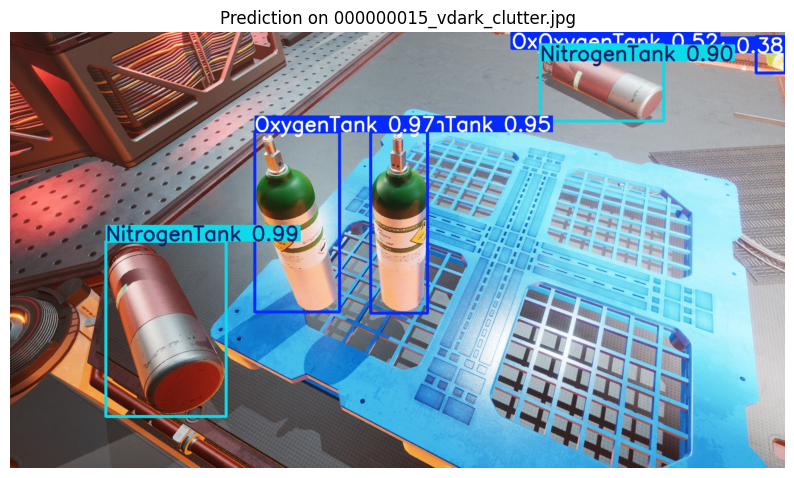

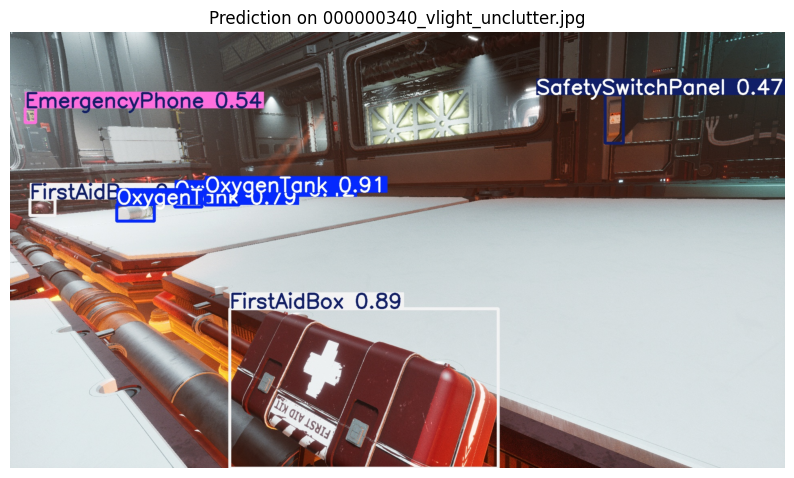

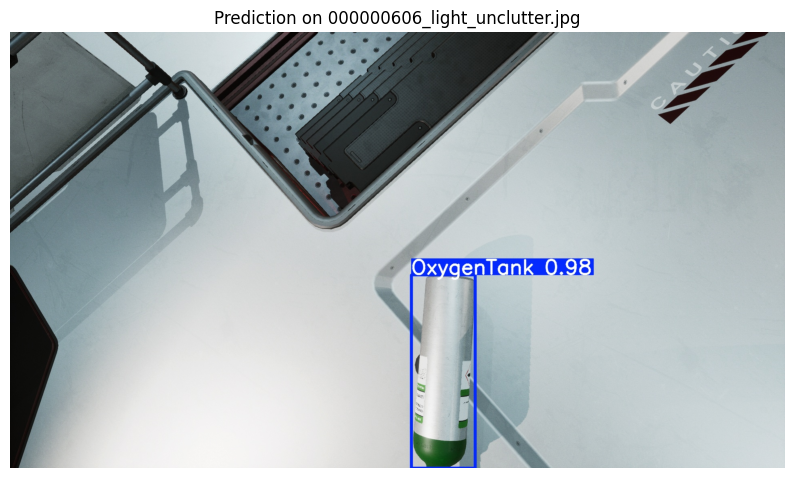

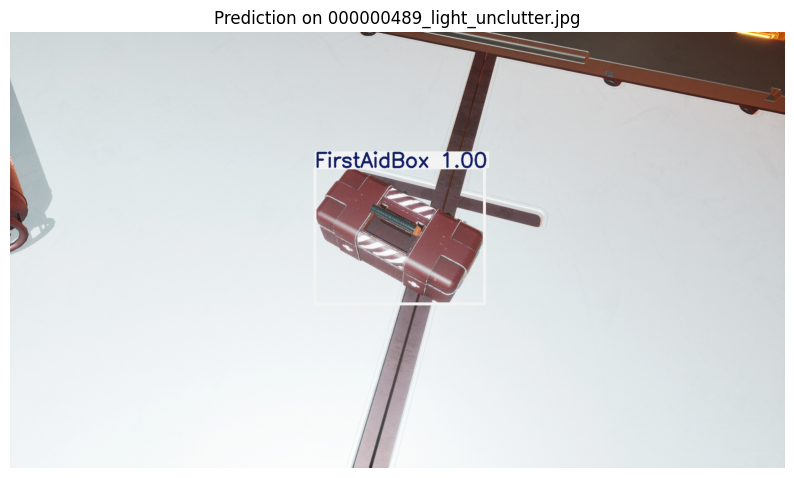

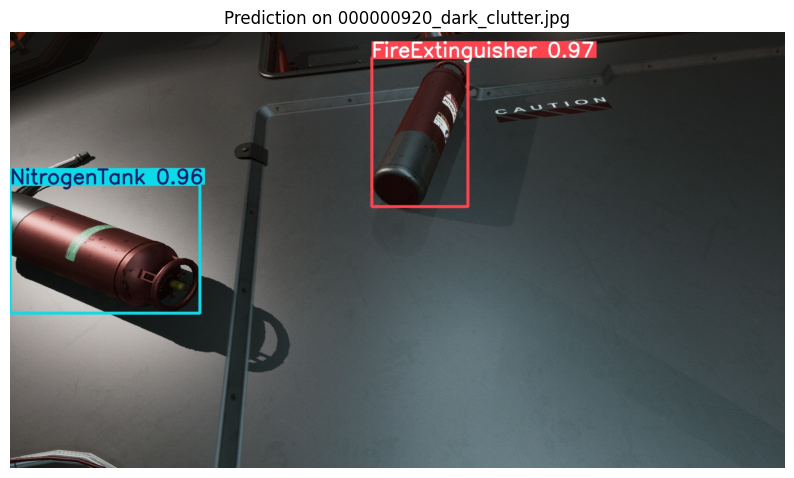

...

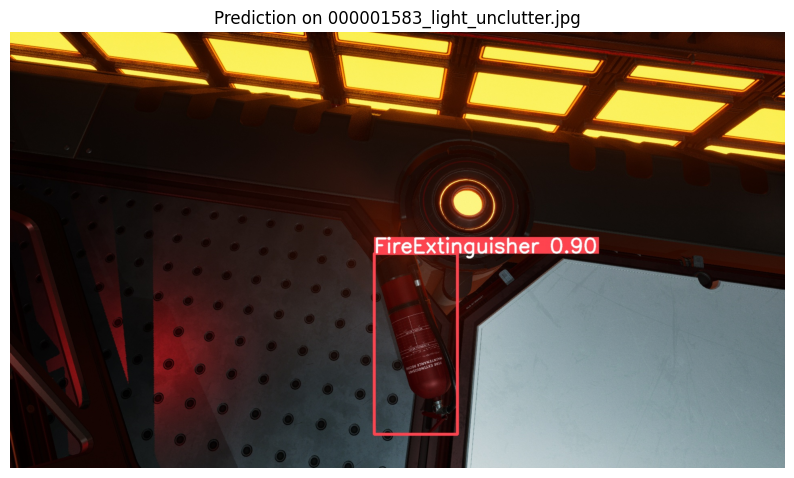

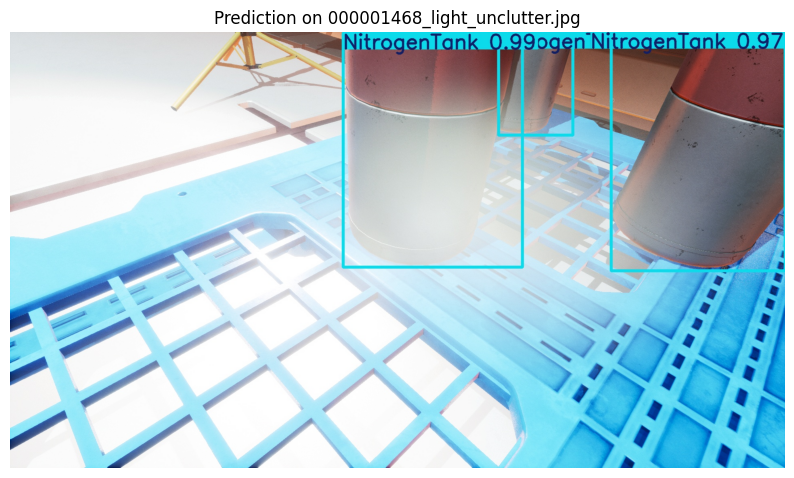

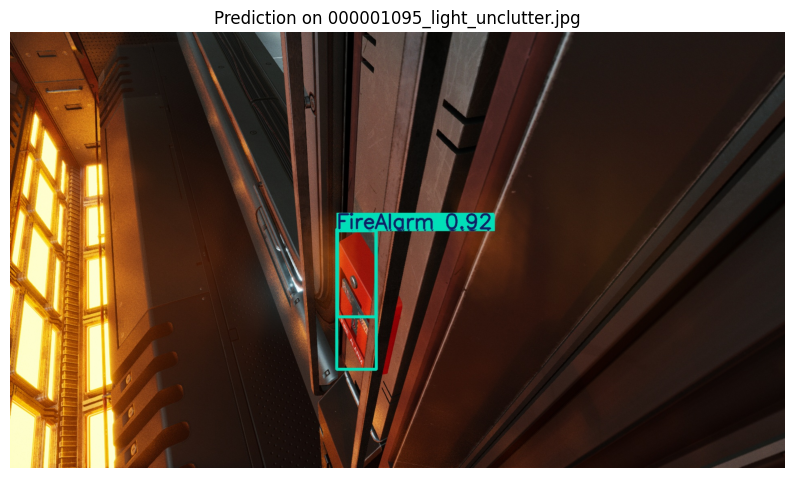

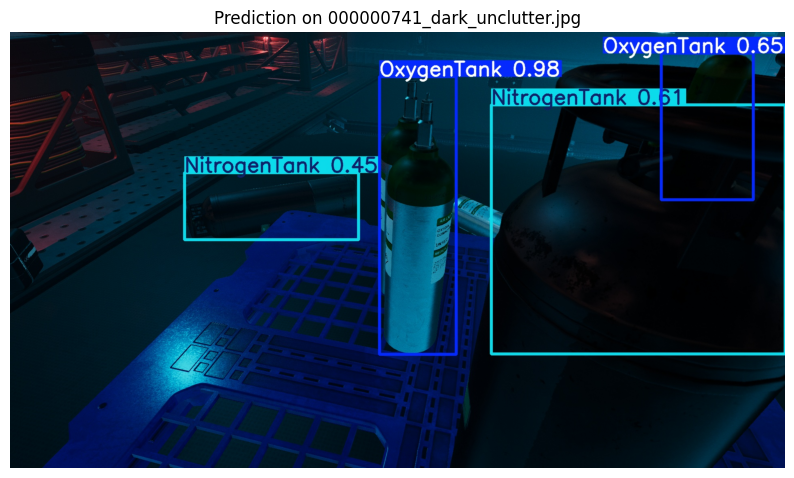

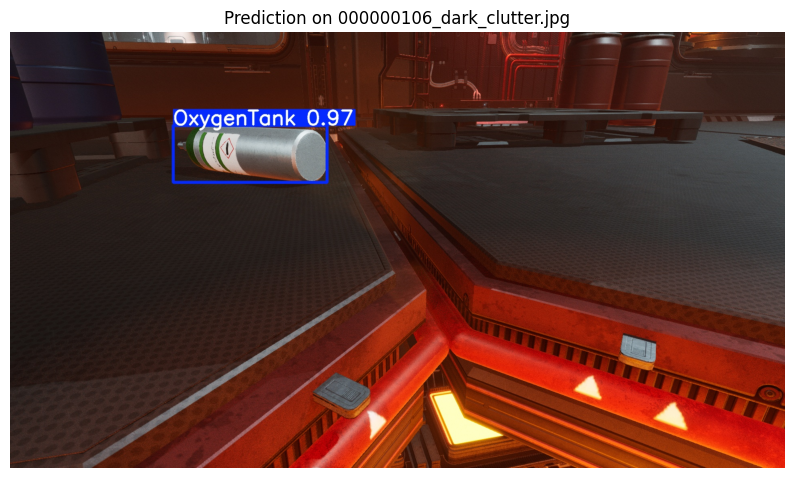

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Directory where prediction results are saved
prediction_output_dir = 'submission/preds'

# Get a list of saved image files (e.g., .jpg, .png)
# You might need to adjust the file extension based on your image format
image_files = [f for f in os.listdir(prediction_output_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if not image_files:
    print(f"No images found in {prediction_output_dir}. Please ensure save=True was used during prediction.")
else:
    # Display the first few images
    num_images_to_display = 25 # Display the first 5 images
    print(f"Displaying the first {num_images_to_display} predicted images from {prediction_output_dir}:")

    for i in range(min(num_images_to_display, len(image_files))):
        img_path = os.path.join(prediction_output_dir, image_files[i])
        img = mpimg.imread(img_path)
        plt.figure(figsize=(10, 10))
        plt.imshow(img)
        plt.title(f"Prediction on {image_files[i]}")
        plt.axis('off')
        plt.show()